In [16]:
import numpy as np
import pandas as pd
import time
import datetime     
from time import mktime
from datetime import datetime
import geopy

In [17]:
all_data = pd.read_csv(r'/Users/alakhsharma/Downloads/archive/atlantic.csv')
all_data = all_data[['ID','Name','Date','Time','Status','Latitude','Longitude','Maximum Wind','Minimum Pressure']]
all_data.sample(5)

,ID,Name,Date,Time,Status,Latitude,Longitude,Maximum Wind,Minimum Pressure
38834,AL071995,FELIX,19950816,0,HU,33.5N,70.1W,70,963
11837,AL091909,UNNAMED,19090919,1200,HU,24.3N,88.0W,105,-999
44283,AL172005,PHILIPPE,20050920,600,HU,17.9N,56.8W,65,987
41164,AL022000,UNNAMED,20000624,1200,TD,9.9N,29.3W,30,1009
10793,AL011906,UNNAMED,19060611,600,TS,26.1N,84.8W,45,-999


In [18]:
all_data = all_data.replace(to_replace=-999, value=0, regex=True)
x = all_data[["Minimum Pressure"]].mean(axis=0)
all_data = all_data.replace(to_replace=0, value=x, regex=True)
all_data.sample(5)

,ID,Name,Date,Time,Status,Latitude,Longitude,Maximum Wind,Minimum Pressure
9337,AL021900,UNNAMED,19000914,0,HU,20.0N,60.6W,75,372.528561
35180,AL161984,JOSEPHINE,19841017,1200,TS,43.0N,53.9W,60,992.000000
26502,AL031963,UNNAMED,19630913,0,TS,38.8N,51.7W,50,372.528561
42083,AL172001,OLGA,20011128,0,HU,32.3N,55.8W,75,975.000000
45218,AL082007,INGRID,20070915,1200,TS,16.3N,53.3W,35,1005.000000


In [19]:
TIME = []
for entry in all_data.iterrows():
    try:
        if entry[1].Time == 0: 
            TIME.append(datetime.strptime(str(entry[1].Date)+' '+str(entry[1].Time),'%Y%m%d %H'))
        else:
            TIME.append(datetime.strptime(str(entry[1].Date)+' '+str(entry[1].Time),'%Y%m%d %H%M'))
    except:
        TIME.append(np.nan)
        continue

In [20]:
len(TIME) == len(all_data)

True

In [21]:
all_data = all_data[['ID','Name','Status','Latitude','Longitude','Maximum Wind','Minimum Pressure']]
all_data['TIME'] = TIME
all_data.tail()

,ID,Name,Status,Latitude,Longitude,Maximum Wind,Minimum Pressure,TIME
49100,AL122015,KATE,EX,41.3N,50.4W,55,981.0,2015-11-12 12:00:00
49101,AL122015,KATE,EX,41.9N,49.9W,55,983.0,2015-11-12 18:00:00
49102,AL122015,KATE,EX,41.5N,49.2W,50,985.0,2015-11-13 00:00:00
49103,AL122015,KATE,EX,40.8N,47.5W,45,985.0,2015-11-13 06:00:00
49104,AL122015,KATE,EX,40.7N,45.4W,45,987.0,2015-11-13 12:00:00


In [22]:
from collections import defaultdict
def get_year():
    years = defaultdict(list)
    for entry in all_data.iterrows():
        years[entry[1].TIME.year].append(entry[1].ID)
    yearz = {}
    each_yr = []
    for key in years:
        each_yr.append(key)
        yearz[key] = set(years[key])
    num_hurricanes = []
    for x in yearz.values(): 
        num_hurricanes.append(len(x))
    return (each_yr, num_hurricanes)
def get_months():
    months = defaultdict(list)
    for entry in all_data.iterrows():
        months[entry[1].TIME.month].append(entry[1].ID)
    m = {}
    each_month = []
    for key in months:
        each_month.append(key)
        m[key] = set(months[key])
    num_hurricanes = []
    for x in m.values(): 
        num_hurricanes.append(len(x))
    return (each_month, num_hurricanes)

<Axes: >

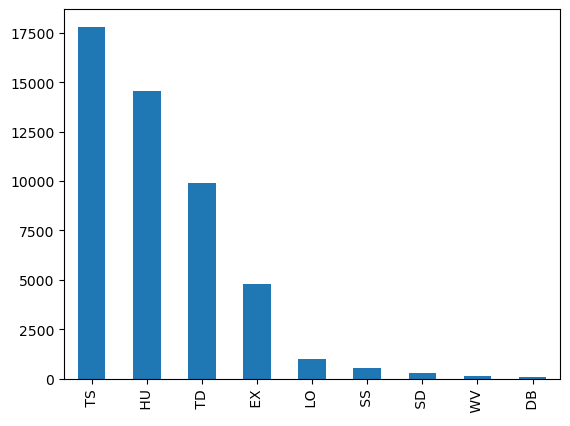

In [23]:
import matplotlib.pyplot as plt
all_data["Status"].value_counts().plot(kind='bar')

Text(0.5, 1.0, 'Number of Hurricanes in the Atlantic')

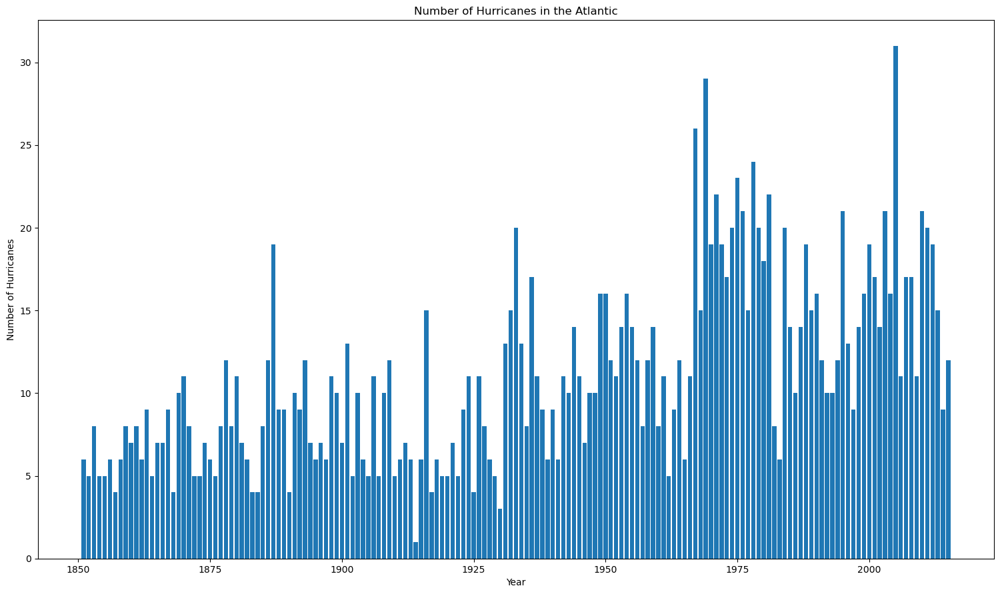

In [24]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots()
fig.set_size_inches(18.5, 10.5)
year_info = get_year()
plt.bar(year_info[0], year_info[1])
plt.xlabel('Year')
plt.ylabel('Number of Hurricanes')
plt.title('Number of Hurricanes in the Atlantic')

Text(0.5, 1.0, 'Hurricanes by Month')

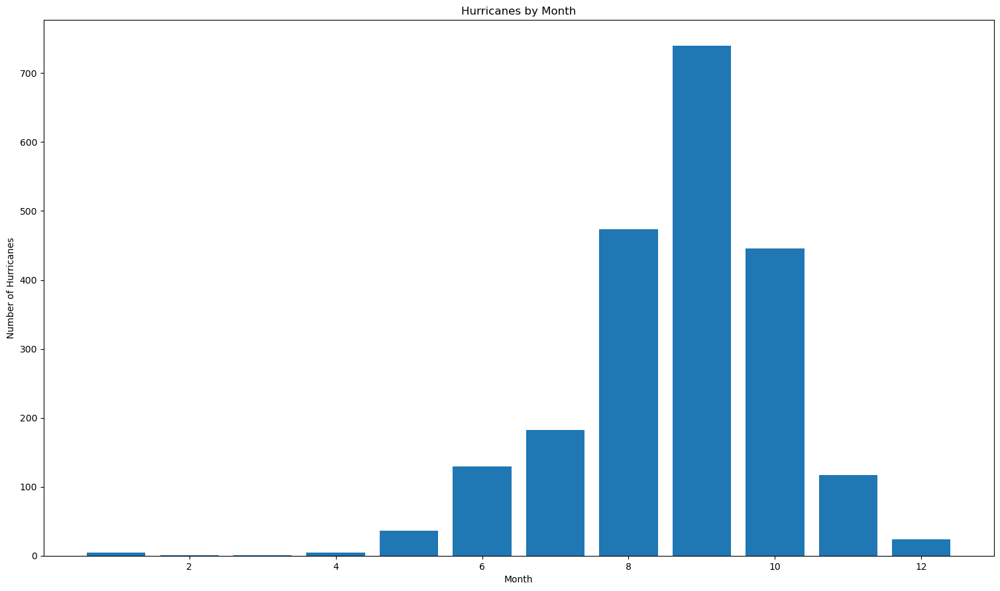

In [25]:
fig, ax = plt.subplots()
fig.set_size_inches(18.5, 10.5)
month_info = get_months()
plt.bar(month_info[0], month_info[1])
plt.xlabel('Month')
plt.ylabel('Number of Hurricanes')
plt.title('Hurricanes by Month')

In [26]:
import re
new_lat = []
new_long = []
for entry in all_data.iterrows(): 
    match = re.search('\d+.\d+', entry[1]['Latitude'])
    match2 = re.search('\d+.\d+', entry[1]['Longitude'])
    new_lat.append(float(match.group()))
    new_long.append(float('-'+match2.group()))
all_data['Longitude'] = new_long
all_data['Latitude'] = new_lat
long = all_data.groupby('ID')['Longitude'].apply(list)
lat = all_data.groupby('ID')['Latitude'].apply(list)

In [27]:
print("Are lat and long the same length? " + str(len(lat)==len(long)))
print(lat.head())
print(long.head())

Are lat and long the same length? True
ID
AL011851    [28.0, 28.0, 28.0, 28.1, 28.2, 28.2, 28.3, 28....
AL011852    [20.5, 20.7, 20.9, 21.1, 21.2, 21.5, 21.7, 21....
AL011853                                               [32.5]
AL011854    [26.0, 26.0, 26.0, 26.0, 26.0, 26.1, 26.2, 26....
AL011855                                               [22.2]
Name: Latitude, dtype: object
ID
AL011851    [-94.8, -95.4, -96.0, -96.5, -96.8, -97.0, -97...
AL011852    [-67.1, -68.0, -68.8, -69.6, -70.6, -71.9, -73...
AL011853                                              [-69.0]
AL011854    [-92.5, -93.0, -93.5, -94.0, -94.7, -95.7, -97...
AL011855                                              [-98.0]
Name: Longitude, dtype: object


In [4]:
pip install cartopy

Note: you may need to restart the kernel to use updated packages.


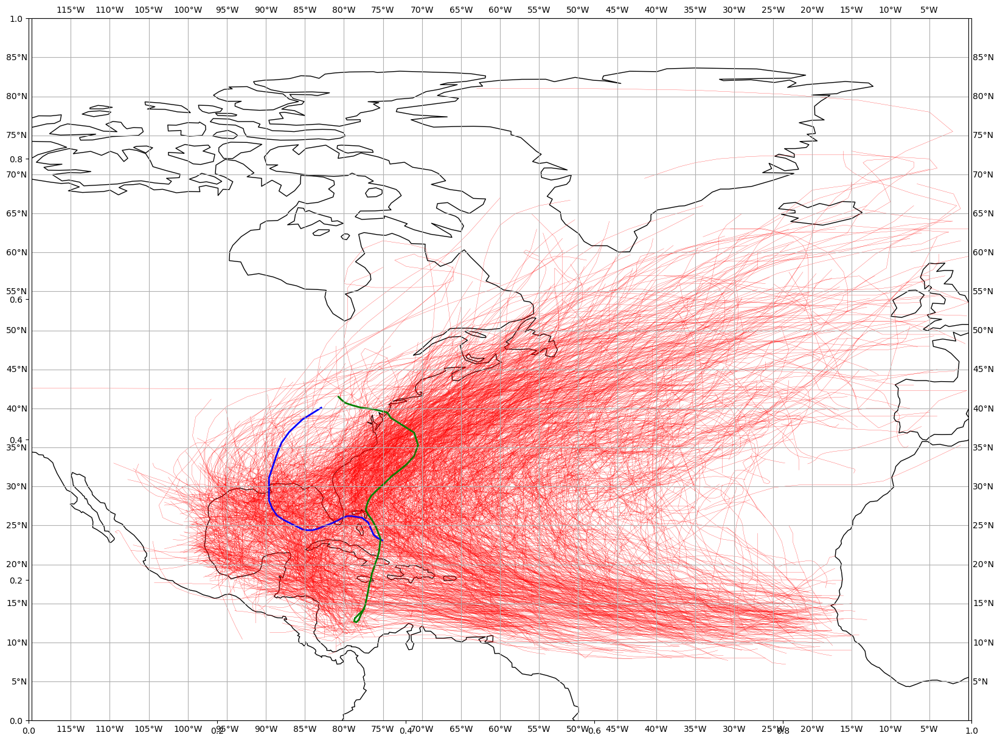

In [28]:
import matplotlib
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy
fig, ax = plt.subplots()
fig.set_size_inches(20, 15)
ax = plt.axes(projection = ccrs.PlateCarree())
ax.set_extent([-120,0,90,0], ccrs.PlateCarree())
ax.gridlines(xlocs=range(-120,5,5), ylocs=range(0,100,5),draw_labels=True)
ax.coastlines()
for index in range(len(lat)):
    if (lat.index[index] == 'AL122005'):
        ax.plot(long[index],lat[index],'b-',linewidth=2)
    elif (lat.index[index] == 'AL182012'):
        ax.plot(long[index],lat[index],'g-',linewidth=2)
    else:
        ax.plot(long[index],lat[index],'r-',linewidth=0.2)
plt.show()

In [5]:
pip install cartopy

Note: you may need to restart the kernel to use updated packages.


/var/folders/3b/7g17_jkn6wq4993m2tfknx_80000gn/T/ipykernel_15589/3695059753.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  start_mid_end = start_mid_end.append({'id':long.index[index], 'start_long':long[index][0],'start_lat':lat[index][0], 'mid_long':long[index][l],'mid_lat':lat[index][l],'death_long':long[index][-1],'death_lat':lat[index][-1]},ignore_index=True)
/var/folders/3b/7g17_jkn6wq4993m2tfknx_80000gn/T/ipykernel_15589/3695059753.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  start_mid_end = start_mid_end.append({'id':long.index[index], 'start_long':long[index][0],'start_lat':lat[index][0], 'mid_long':long[index][l],'mid_lat':lat[index][l],'death_long':long[index][-1],'death_lat':lat[index][-1]},ignore_index=True)
/var/folders/3b/7g17_jkn6wq4993m2tfknx_80000gn/T/ipykernel_15589/3695059753.py

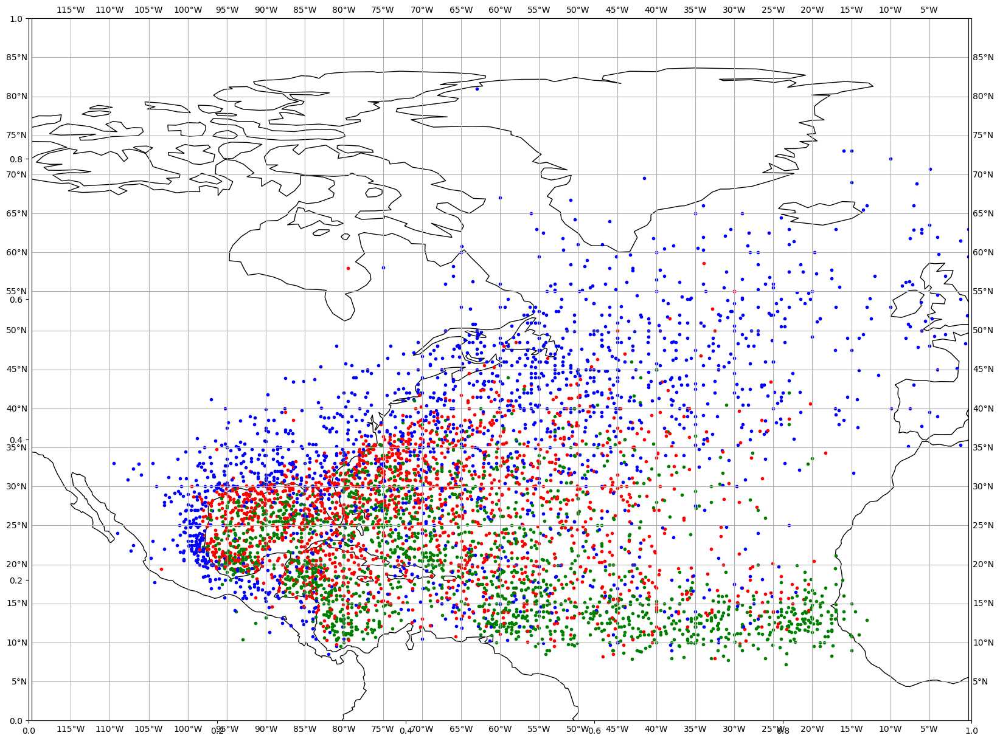

In [29]:
fig, ax = plt.subplots()
fig.set_size_inches(20, 15)
ax = plt.axes(projection = ccrs.PlateCarree())
ax.set_extent([-120,0,90,0], ccrs.PlateCarree())
ax.gridlines(xlocs=range(-120,5,5), ylocs=range(0,100,5),draw_labels=True)
ax.coastlines()
start_mid_end = pd.DataFrame(columns=['id', 'start_long','start_lat', 'mid_long','mid_lat','death_long','death_lat'])
for index in range(len(lat)):
    l = int(len(long[index])/2)
    ax.plot(long[index][l],lat[index][l],'ro',markersize=3)
    ax.plot(long[index][-1],lat[index][-1],'bo',markersize=3)
    ax.plot(long[index][0],lat[index][0],'go',markersize=3)
    start_mid_end = start_mid_end.append({'id':long.index[index], 'start_long':long[index][0],'start_lat':lat[index][0], 'mid_long':long[index][l],'mid_lat':lat[index][l],'death_long':long[index][-1],'death_lat':lat[index][-1]},ignore_index=True)  
plt.show()

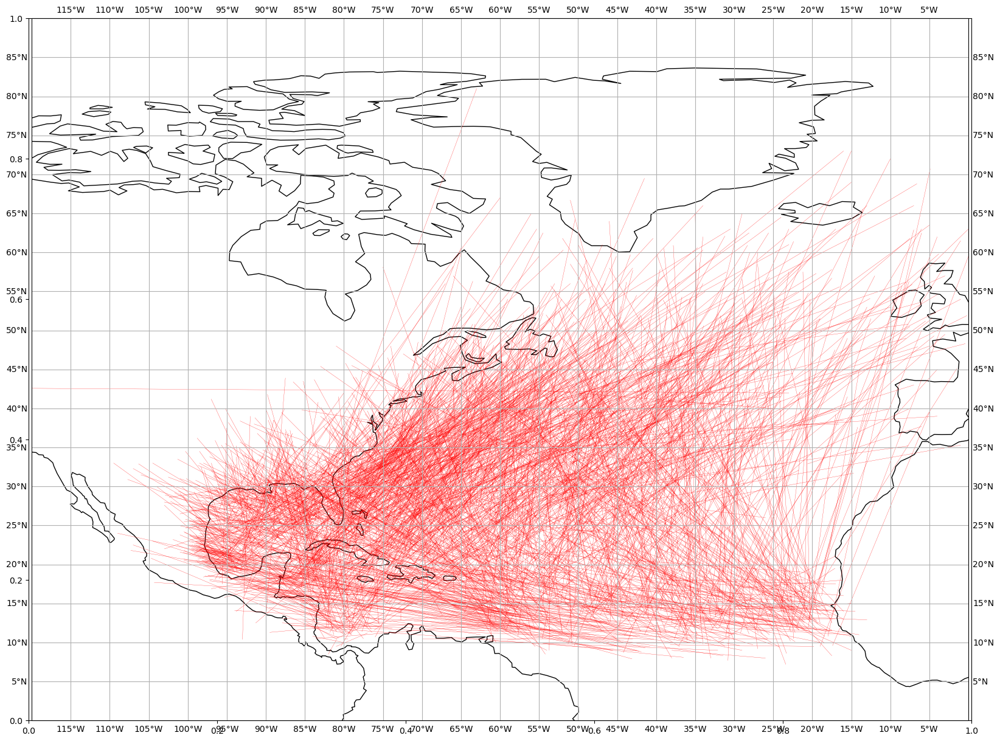

In [30]:
fig, ax = plt.subplots()
fig.set_size_inches(20, 15)
ax = plt.axes(projection = ccrs.PlateCarree())
ax.set_extent([-120,0,90,0], ccrs.PlateCarree())
ax.gridlines(xlocs=range(-120,5,5), ylocs=range(0,100,5),draw_labels=True)
ax.coastlines()
slope = []
for index in range(len(lat)):
    ax.plot([long[index][0],long[index][-1]],[lat[index][0],lat[index][-1]],'r-',linewidth=0.2) 
    if (long[index][-1]-long[index][0] == 0):
        slope.append(None)
    else:
        slope.append((lat[index][-1] - lat[index][0])/(long[index][-1] - long[index][0]))
all_slopes = pd.Series(data=slope,index=lat.index)
plt.show()

In [31]:
from geopy.distance import geodesic
dist = []
for index in range(len(lat)):
    d = 0
    for pos in range(len(lat[index])-1):
        p1 = (lat[index][pos], long[index][pos])
        p2 = (lat[index][pos+1], long[index][pos])
        d = d + geodesic(p1,p2).miles
    dist.append(d)
all_dist = pd.Series(data=dist,index=lat.index)
len(all_dist) == len(all_slopes)

True

In [32]:
slope_dist = pd.concat([all_dist, all_slopes], axis=1)
slope_dist.columns =['distance traveled','slope']
slope_dist.sample(5)

,distance traveled,slope
ID,,
AL122013,454.276249,-1.294118
AL032011,1173.210326,0.536278
AL011997,792.668027,1.036036
AL112011,758.026720,-2.291667
AL041874,833.040704,-3.270270


(-25.0, 25.0)

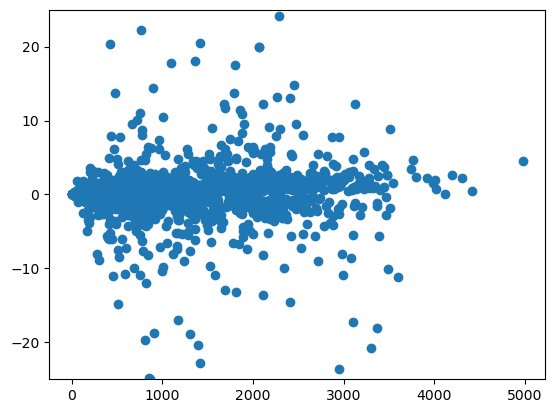

In [33]:
plt.scatter(slope_dist['distance traveled'], slope_dist['slope'])
plt.ylim(-25,25)

In [34]:
start_mid_end

,id,start_long,start_lat,mid_long,mid_lat,death_long,death_lat
0,AL011851,-94.8,28.0,-98.3,28.4,-100.2,31.0
1,AL011852,-67.1,20.5,-87.1,27.7,-68.0,41.0
2,AL011853,-69.0,32.5,-69.0,32.5,-69.0,32.5
3,AL011854,-92.5,26.0,-95.7,26.1,-103.0,28.0
4,AL011855,-98.0,22.2,-98.0,22.2,-98.0,22.2
...,...,...,...,...,...,...,...
1809,AL282005,-62.1,13.2,-84.1,15.8,-83.5,15.4
1810,AL291969,-81.0,10.3,-81.0,9.8,-82.0,8.5
1811,AL292005,-48.0,27.0,-38.9,24.6,-1.0,35.3
1812,AL302005,-49.2,31.5,-39.8,34.3,-39.2,24.7


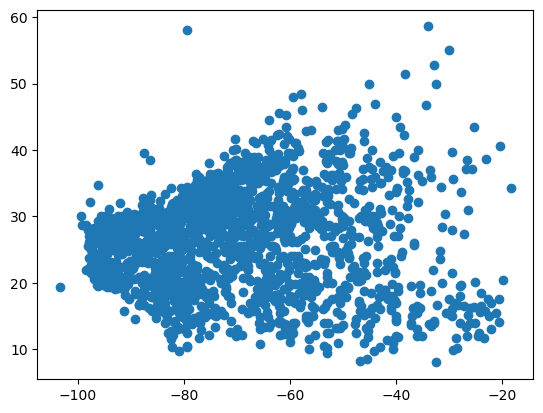

In [35]:
plt.scatter(start_mid_end['mid_long'], start_mid_end['mid_lat'])
plt.show()

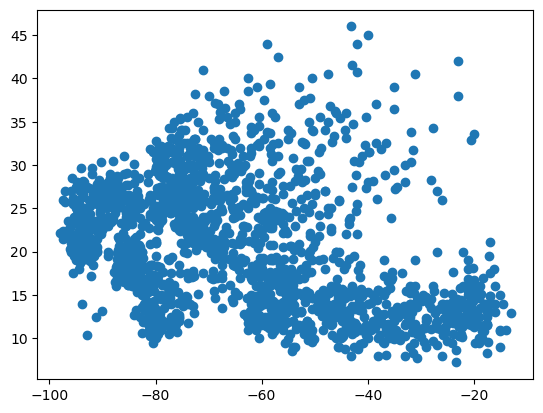

In [36]:
plt.scatter(start_mid_end['start_long'], start_mid_end['start_lat'])
plt.show()

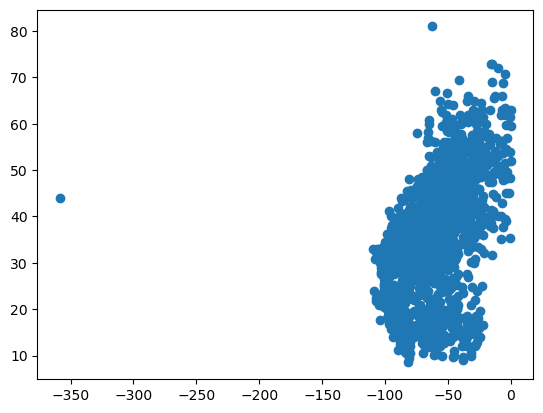

In [37]:
plt.scatter(start_mid_end['death_long'], start_mid_end['death_lat'])
plt.show()

In [38]:
from sklearn.cluster import AgglomerativeClustering
from collections import defaultdict

In [40]:
def doAgglo(X, num_clusters):
    model = AgglomerativeClustering(n_clusters=num_clusters, affinity = 'euclidean', linkage = 'ward')
    labels = model.fit_predict(X)
    return (labels)
def get_plot(X1,X2,lab,t):
    fig = plt.figure()
    ax = fig.add_subplot(111)
    scatter = ax.scatter(X1,X2,c=lab, s=50)
    plt.xlim(-120,0)
    plt.ylim(0,90)
    plt.title(str(t) + ' Clusters')
def c_mean_2(vals,labels,n_clusters):
    sorter = defaultdict(list)
    for index in range(len(labels)): 
        sorter[labels[index]].append(vals[index])
    some = 0
    for cluster_num in range(n_clusters): 
        arr = np.asarray(sorter[cluster_num])
        some = some + np.sum(np.square(np.asarray(arr) - np.mean(arr)))
    return some/len(vals)

/Users/alakhsharma/miniconda3/envs/alakh/lib/python3.8/site-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
/Users/alakhsharma/miniconda3/envs/alakh/lib/python3.8/site-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
/Users/alakhsharma/miniconda3/envs/alakh/lib/python3.8/site-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
/Users/alakhsharma/miniconda3/envs/alakh/lib/python3.8/site-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
/Users/alakhsharma/miniconda3/envs/alakh

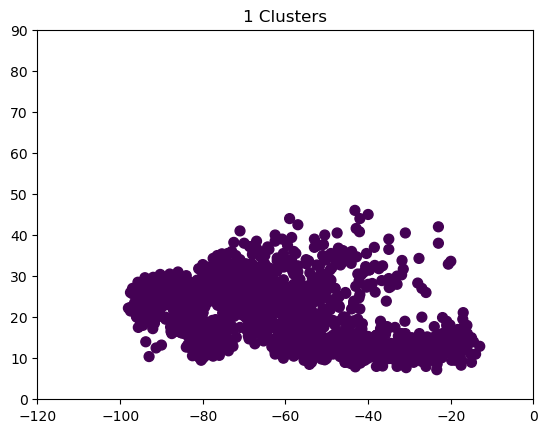

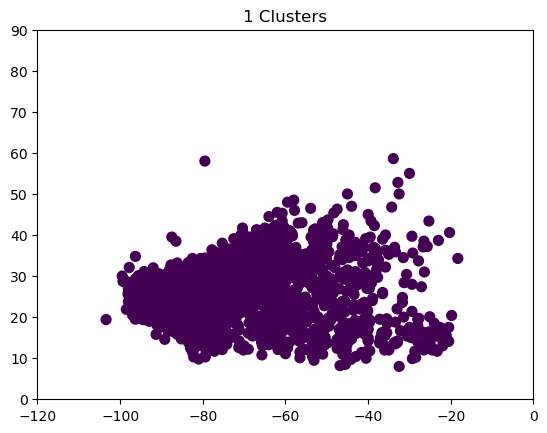

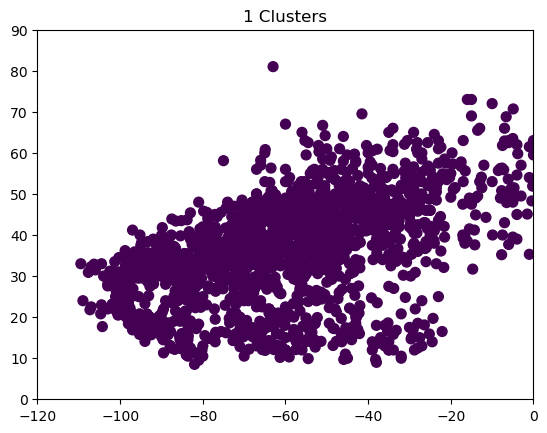

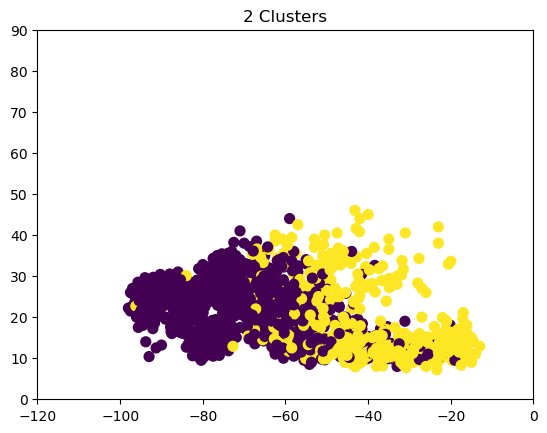

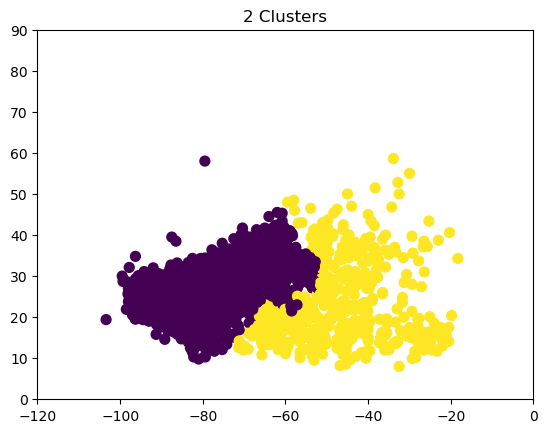

...

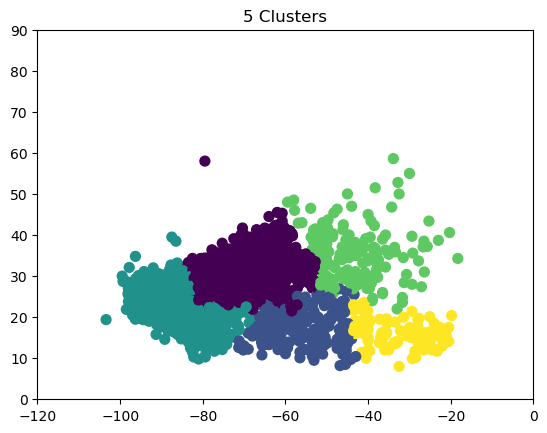

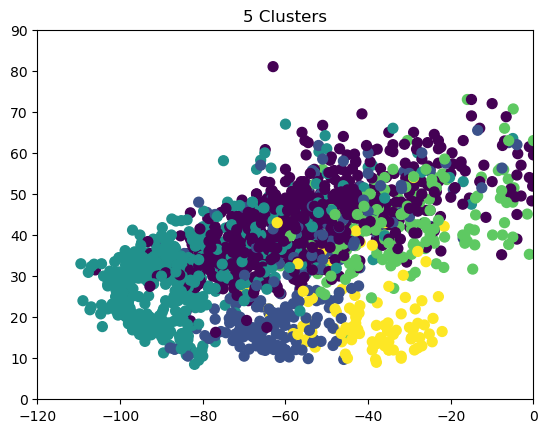

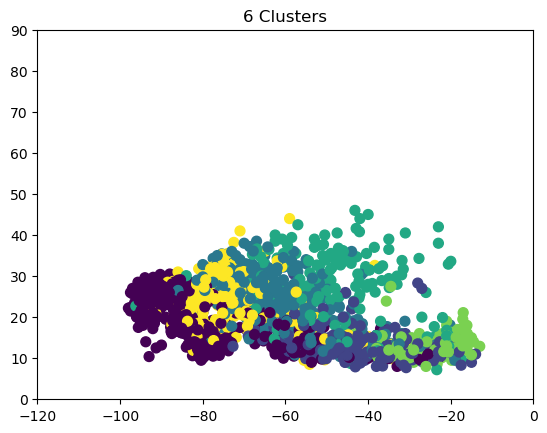

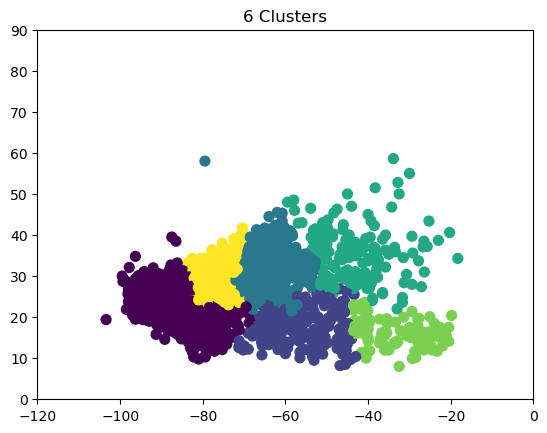

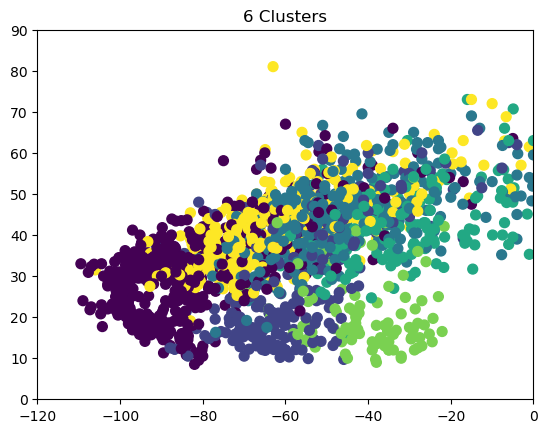

In [41]:
err = []
for i in range(1,7):
    temp = 0
    lab = doAgglo(start_mid_end[['mid_long','mid_lat']],i)
    get_plot(start_mid_end['start_long'],start_mid_end['start_lat'],lab,i)
    get_plot(start_mid_end['mid_long'],start_mid_end['mid_lat'],lab,i)
    get_plot(start_mid_end['death_long'],start_mid_end['death_lat'],lab,i)
    temp = temp + c_mean_2(start_mid_end['mid_long'],lab,i)
    temp = temp + c_mean_2(start_mid_end['mid_lat'],lab,i)
    temp = temp + c_mean_2(start_mid_end['start_long'],lab,i)
    temp = temp + c_mean_2(start_mid_end['start_lat'],lab,i)
    temp = temp + c_mean_2(start_mid_end['death_long'],lab,i)
    temp = temp + c_mean_2(start_mid_end['death_lat'],lab,i)
    err.append(temp)

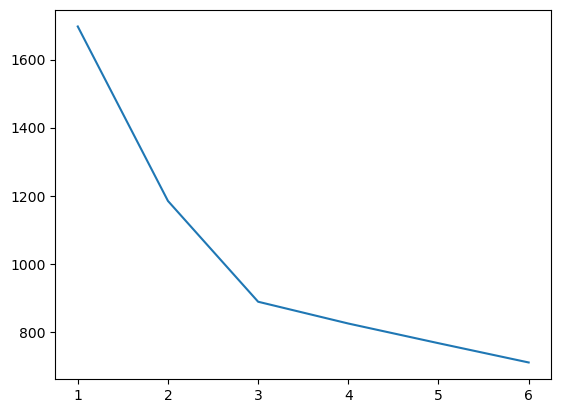

In [42]:
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(range(1,7),err)

In [43]:
lab = doAgglo(start_mid_end[['mid_long','mid_lat']],3)
df0 = pd.DataFrame()
df1 = pd.DataFrame()
df2 = pd.DataFrame()
dfALL = pd.DataFrame()
for index in range(len(start_mid_end)):
    if (lab[index] == 0): 
        df0 = df0.append({'id':start_mid_end['id'][index],'lats':lat[start_mid_end['id'][index]], 'longs':long[start_mid_end['id'][index]]},ignore_index=True)
        dfALL = dfALL.append({'id':start_mid_end['id'][index],'lats':lat[start_mid_end['id'][index]], 'longs':long[start_mid_end['id'][index]]},ignore_index=True)
    elif (lab[index] == 1): 
        df1 = df1.append({'id':start_mid_end['id'][index],'lats':lat[start_mid_end['id'][index]], 'longs':long[start_mid_end['id'][index]]},ignore_index=True)
        dfALL = dfALL.append({'id':start_mid_end['id'][index],'lats':lat[start_mid_end['id'][index]], 'longs':long[start_mid_end['id'][index]]},ignore_index=True)
    elif (lab[index] == 2): 
        df2 = df2.append({'id':start_mid_end['id'][index],'lats':lat[start_mid_end['id'][index]], 'longs':long[start_mid_end['id'][index]]},ignore_index=True)  
        dfALL = dfALL.append({'id':start_mid_end['id'][index],'lats':lat[start_mid_end['id'][index]], 'longs':long[start_mid_end['id'][index]]},ignore_index=True)
print(len(dfALL))

/Users/alakhsharma/miniconda3/envs/alakh/lib/python3.8/site-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
/var/folders/3b/7g17_jkn6wq4993m2tfknx_80000gn/T/ipykernel_15589/3917019138.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append({'id':start_mid_end['id'][index],'lats':lat[start_mid_end['id'][index]], 'longs':long[start_mid_end['id'][index]]},ignore_index=True)
/var/folders/3b/7g17_jkn6wq4993m2tfknx_80000gn/T/ipykernel_15589/3917019138.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  dfALL = dfALL.append({'id':start_mid_end['id'][index],'lats':lat[start_mid_end['id'][index]], 'longs':long[start_mid_end['id'][index]]},ignore_index=True)
/var/folders/3b/7g

1814


/var/folders/3b/7g17_jkn6wq4993m2tfknx_80000gn/T/ipykernel_15589/3917019138.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  dfALL = dfALL.append({'id':start_mid_end['id'][index],'lats':lat[start_mid_end['id'][index]], 'longs':long[start_mid_end['id'][index]]},ignore_index=True)
/var/folders/3b/7g17_jkn6wq4993m2tfknx_80000gn/T/ipykernel_15589/3917019138.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append({'id':start_mid_end['id'][index],'lats':lat[start_mid_end['id'][index]], 'longs':long[start_mid_end['id'][index]]},ignore_index=True)
/var/folders/3b/7g17_jkn6wq4993m2tfknx_80000gn/T/ipykernel_15589/3917019138.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  dfALL = dfALL.append({'id':start_mid_end

In [44]:
len(df1) + len(df0) + len(df2)

1814

In [45]:
df0.head()

,id,lats,longs
0,AL011863,"[37.7, 38.5, 39.2, 39.8, 40.3, 40.9, 41.5, 42.0]","[-50.8, -50.5, -50.0, -49.3, -48.5, -47.7, -46..."
1,AL011869,"[40.5, 41.5, 42.5, 43.5]","[-47.5, -46.8, -46.0, -45.0]"
2,AL011876,"[39.0, 39.5, 40.0, 40.7, 41.5, 42.4, 43.0, 43....","[-60.8, -60.4, -60.0, -59.3, -58.3, -57.2, -56..."
3,AL011882,"[37.5, 38.5, 40.0, 42.0, 45.0]","[-52.0, -52.0, -51.5, -50.5, -49.0]"
4,AL011884,"[38.5, 40.0, 41.5, 43.5, 45.8, 48.3, 50.0, 50....","[-62.5, -61.7, -60.7, -58.8, -56.3, -53.1, -50..."


In [46]:
df1.head()

,id,lats,longs
0,AL011853,[32.5],[-69.0]
1,AL011857,"[34.0, 34.5, 35.0, 35.2, 35.4, 35.5, 35.8, 36.0]","[-74.5, -73.8, -72.6, -71.4, -70.1, -68.9, -67..."
2,AL011861,"[15.1, 15.5, 15.8, 16.2, 16.7, 17.4, 18.0, 18....","[-58.5, -59.3, -60.1, -60.9, -61.6, -62.4, -63..."
3,AL011862,"[32.0, 32.5, 33.0, 33.3, 33.5, 33.9, 34.2, 34....","[-75.6, -75.3, -75.0, -74.6, -74.4, -74.1, -73..."
4,AL011864,"[30.8, 31.8, 33.0, 34.5, 36.0, 37.3, 38.5, 39....","[-76.0, -75.1, -74.0, -72.4, -69.8, -67.0, -64..."


In [47]:
df2.head()

,id,lats,longs
0,AL011851,"[28.0, 28.0, 28.0, 28.1, 28.2, 28.2, 28.3, 28....","[-94.8, -95.4, -96.0, -96.5, -96.8, -97.0, -97..."
1,AL011852,"[20.5, 20.7, 20.9, 21.1, 21.2, 21.5, 21.7, 21....","[-67.1, -68.0, -68.8, -69.6, -70.6, -71.9, -73..."
2,AL011854,"[26.0, 26.0, 26.0, 26.0, 26.0, 26.1, 26.2, 26....","[-92.5, -93.0, -93.5, -94.0, -94.7, -95.7, -97..."
3,AL011855,[22.2],[-98.0]
4,AL011856,"[25.0, 25.7, 26.3, 27.0, 27.7, 28.2, 28.7, 29....","[-83.9, -85.1, -86.5, -87.8, -89.1, -89.8, -90..."


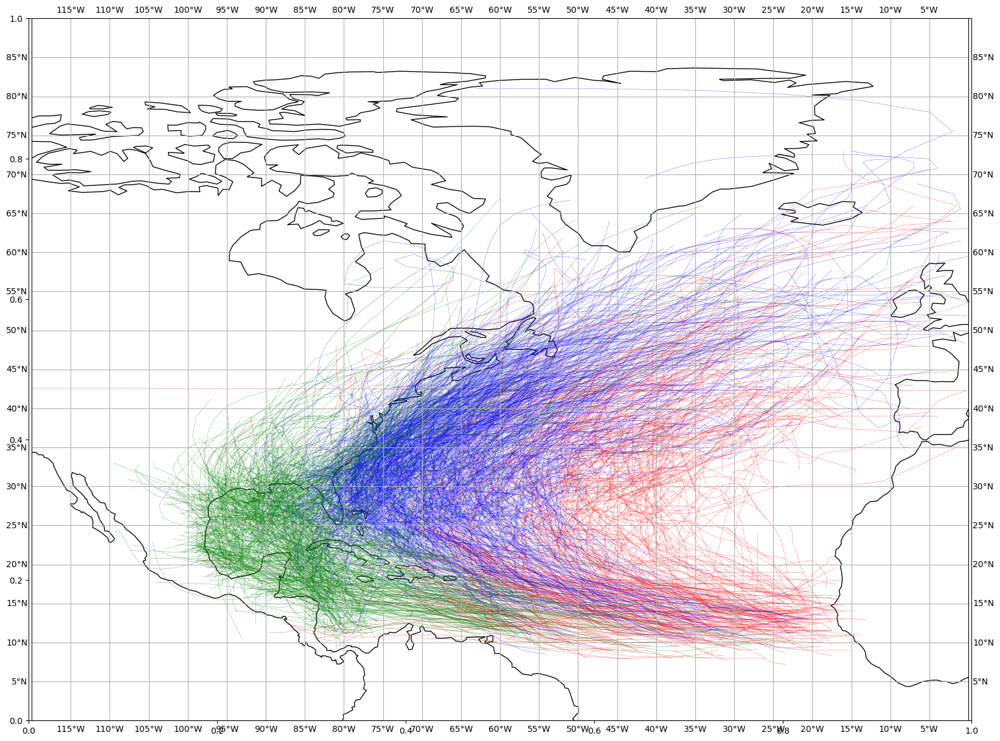

In [48]:
fig, ax = plt.subplots()
fig.set_size_inches(20, 15)
ax = plt.axes(projection = ccrs.PlateCarree())
ax.set_extent([-120,0,90,0], ccrs.PlateCarree())
ax.gridlines(xlocs=range(-120,5,5), ylocs=range(0,100,5),draw_labels=True)
ax.coastlines()
for index in range(len(df0)):
    ax.plot(df0['longs'][index],df0['lats'][index],'r-',linewidth=0.2)
for index in range(len(df1)):
    ax.plot(df1['longs'][index],df1['lats'][index],'b-',linewidth=0.2)
for index in range(len(df2)):
    ax.plot(df2['longs'][index],df2['lats'][index],'g-',linewidth=0.2)

plt.show()

In [49]:
def f_transf(lati,longi): 
    if (lati < 90) and (lati >= 0) and (longi < 0) and (longi > -120):
        return (int(lati) * 121) + int((-longi))
    else: 
        return None
def index_to_coord(index):
    return((index/121),(-(index%121)))  

In [50]:
def make_markhov_values(data, mat_in, f_tranf):
    for coord_list in data.iterrows():
        l = len(coord_list[1]['lats'])
        for index in range(l-1):
            pos = f_tranf(coord_list[1]['lats'][index],coord_list[1]['longs'][index])
            pos_pr = f_tranf(coord_list[1]['lats'][index + 1],coord_list[1]['longs'][index + 1])
            if (pos == None) or (pos_pr == None):
                break
            mat_in[pos][pos_pr] = mat_in[pos][pos_pr] + 1
        pos1 = f_tranf(coord_list[1]['lats'][-1],coord_list[1]['longs'][-1])
        if (pos1 != None):
            mat_in[pos1][-1] = mat_in[pos1][-1] + 1
    return mat_in
def fix_probability(mat_in):        
    for i in range(len(mat_in)): 
        if sum(mat_in[i]) == 0:
            mat_in[i][-1] = 1
        l = mat_in[i]/sum(mat_in[i])
        mat_in[i] = l
    return mat_in

In [51]:
size = 10890
def generate(matrix, start_lat, start_long,f_to, f_back):
    path = []
    dead_hur = False 
    curr_index = f_to(start_lat,start_long)
    path.append(f_back(curr_index))
    while not dead_hur: 
        arr = (np.random.choice(range(0,len(matrix)), 1, p=matrix[curr_index]))
        curr_index = arr[0]
        if (curr_index != len(matrix) - 1): 
            path.append(f_back(curr_index))
        else: 
            dead_hur = True
    return path

In [52]:
mat0 = np.zeros(shape=(size,size))
mat0 = make_markhov_values(df0,mat0,f_transf)
mat0 = fix_probability(mat0)

In [53]:
mat1 = np.zeros(shape=(size,size))
mat1 = make_markhov_values(df1,mat1,f_transf)
mat1 = fix_probability(mat1)

In [54]:
mat2 = np.zeros(shape=(size,size))
mat2 = make_markhov_values(df2,mat2,f_transf)
mat2 = fix_probability(mat2)

In [60]:
matALL = np.zeros(shape=(size,size))
matALL = make_markhov_values(dfALL,matALL,f_transf)
matALL = fix_probability(matALL)

In [65]:
import reverse_geocoder as rg
def make_predict(actual_longs,actual_lats, num, matrix):
    fig, ax = plt.subplots()
    fig.set_size_inches(20, 15)
    ax = plt.axes(projection = ccrs.PlateCarree())
    ax.set_extent([-120,0,90,0], ccrs.PlateCarree())
    ax.gridlines(xlocs=range(-120,5,5), ylocs=range(0,100,5),draw_labels=True)
    ax.coastlines()
    start_lat = actual_lats[0]
    start_long = actual_longs[0]
    for i in range(num): 
        arr = list(map(list, zip(*generate(matrix,start_lat,start_long,f_transf,index_to_coord))))
        ax.plot(arr[1],arr[0])
        print(i, len(arr[1]), len(arr[0]))
        for j in range(len(arr[1])):
            x = arr[1][j] 
            y = arr[0][j]
            coordinates = (x,y)
            loc = rg.search(coordinates)
            print(loc)
    ax.plot(actual_longs,actual_lats,'bo',markersize=3)
    plt.show()

In [66]:
def predict_path(genesis):
    batch_size = 1;
    atl1_id = None;
    try:
        hurricane = df0.loc[df0['id'] == atl_id]
        make_predict(list(hurricane['longs'])[0],list(hurricane['lats'])[0],batch_size,mat0)
    except: 
        try:
            hurricane = df1.loc[df1['id'] == atl_id]
            make_predict(list(hurricane['longs'])[0],list(hurricane['lats'])[0],batch_size,mat1)
        except: 
            try:
                hurricane = df2.loc[df2['id'] == atl_id]
                make_predict(list(hurricane['longs'])[0],list(hurricane['lats'])[0],batch_size,mat2)
            except: 
                make_predict(genesis[0],genesis[1],batch_size,matALL)

In [67]:
#predict_path('AL122005',(None, None),1)

0 12 12
Loading formatted geocoded file...
[{'lat': '-34.03139', 'lon': '18.41833', 'name': 'Constantia', 'admin1': 'Western Cape', 'admin2': 'City of Cape Town', 'cc': 'ZA'}]
[{'lat': '-34.4187', 'lon': '19.23446', 'name': 'Hermanus', 'admin1': 'Western Cape', 'admin2': 'Overberg District Municipality', 'cc': 'ZA'}]
[{'lat': '-34.4187', 'lon': '19.23446', 'name': 'Hermanus', 'admin1': 'Western Cape', 'admin2': 'Overberg District Municipality', 'cc': 'ZA'}]
[{'lat': '-34.4187', 'lon': '19.23446', 'name': 'Hermanus', 'admin1': 'Western Cape', 'admin2': 'Overberg District Municipality', 'cc': 'ZA'}]
[{'lat': '-34.4187', 'lon': '19.23446', 'name': 'Hermanus', 'admin1': 'Western Cape', 'admin2': 'Overberg District Municipality', 'cc': 'ZA'}]
[{'lat': '-34.4187', 'lon': '19.23446', 'name': 'Hermanus', 'admin1': 'Western Cape', 'admin2': 'Overberg District Municipality', 'cc': 'ZA'}]
[{'lat': '-34.4187', 'lon': '19.23446', 'name': 'Hermanus', 'admin1': 'Western Cape', 'admin2': 'Overberg Dis

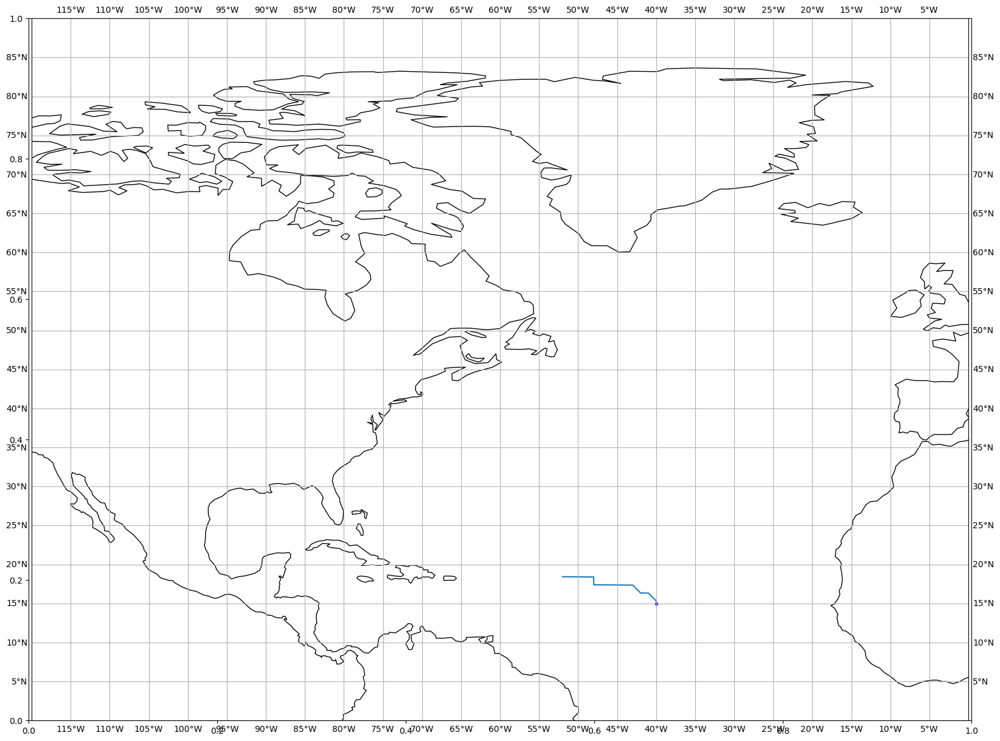

In [68]:
predict_path(([-40], [15]))

0 8 8
[{'lat': '-34.53215', 'lon': '20.04031', 'name': 'Bredasdorp', 'admin1': 'Western Cape', 'admin2': 'Overberg District Municipality', 'cc': 'ZA'}]
[{'lat': '-34.53215', 'lon': '20.04031', 'name': 'Bredasdorp', 'admin1': 'Western Cape', 'admin2': 'Overberg District Municipality', 'cc': 'ZA'}]
[{'lat': '-34.53215', 'lon': '20.04031', 'name': 'Bredasdorp', 'admin1': 'Western Cape', 'admin2': 'Overberg District Municipality', 'cc': 'ZA'}]
[{'lat': '-34.53215', 'lon': '20.04031', 'name': 'Bredasdorp', 'admin1': 'Western Cape', 'admin2': 'Overberg District Municipality', 'cc': 'ZA'}]
[{'lat': '-34.05065', 'lon': '24.9195', 'name': "Jeffrey's Bay", 'admin1': 'Eastern Cape', 'admin2': 'Cacadu District Municipality', 'cc': 'ZA'}]
[{'lat': '-34.05065', 'lon': '24.9195', 'name': "Jeffrey's Bay", 'admin1': 'Eastern Cape', 'admin2': 'Cacadu District Municipality', 'cc': 'ZA'}]
[{'lat': '-34.05065', 'lon': '24.9195', 'name': "Jeffrey's Bay", 'admin1': 'Eastern Cape', 'admin2': 'Cacadu District 

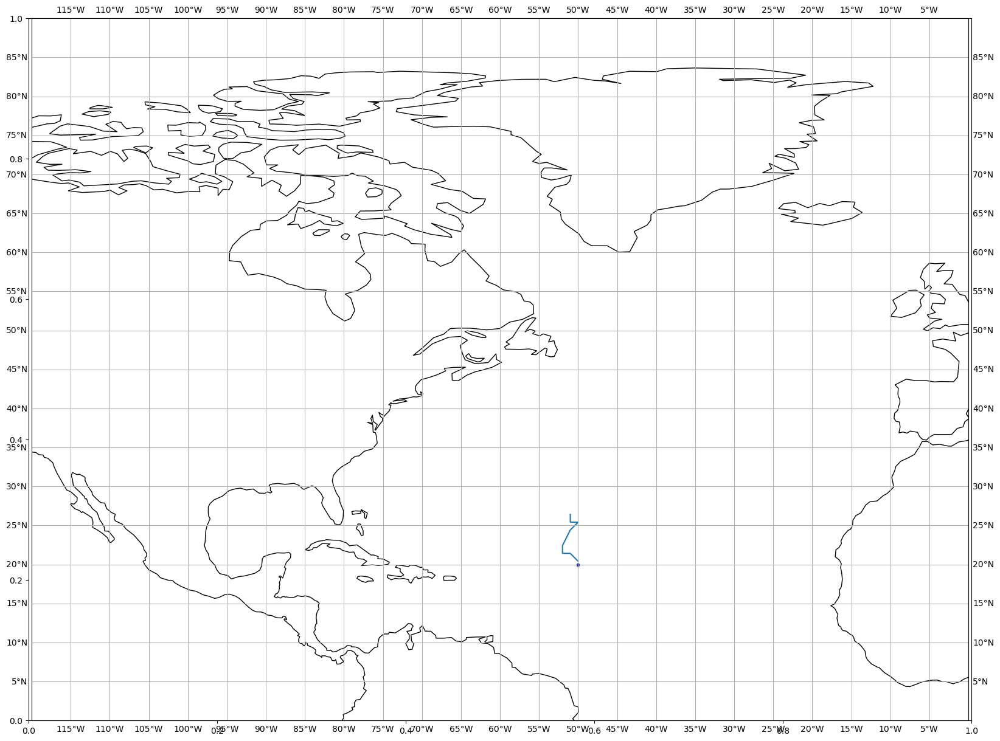

In [69]:
predict_path(([-50], [20]))

0 22 22
[{'lat': '-18.06068', 'lon': '13.83998', 'name': 'Opuwo', 'admin1': 'Kunene', 'admin2': '', 'cc': 'NA'}]
[{'lat': '-18.06068', 'lon': '13.83998', 'name': 'Opuwo', 'admin1': 'Kunene', 'admin2': '', 'cc': 'NA'}]
[{'lat': '-20.36667', 'lon': '14.96667', 'name': 'Khorixas', 'admin1': 'Kunene', 'admin2': '', 'cc': 'NA'}]
[{'lat': '-22.11667', 'lon': '14.28333', 'name': 'Hentiesbaai', 'admin1': 'Erongo', 'admin2': '', 'cc': 'NA'}]
[{'lat': '-22.9575', 'lon': '14.50528', 'name': 'Walvis Bay', 'admin1': 'Erongo', 'admin2': '', 'cc': 'NA'}]
[{'lat': '-22.9575', 'lon': '14.50528', 'name': 'Walvis Bay', 'admin1': 'Erongo', 'admin2': '', 'cc': 'NA'}]
[{'lat': '-26.64806', 'lon': '15.15944', 'name': 'Luderitz', 'admin1': 'Karas', 'admin2': '', 'cc': 'NA'}]
[{'lat': '-26.64806', 'lon': '15.15944', 'name': 'Luderitz', 'admin1': 'Karas', 'admin2': '', 'cc': 'NA'}]
[{'lat': '-28.55', 'lon': '16.43333', 'name': 'Oranjemund', 'admin1': 'Karas', 'admin2': '', 'cc': 'NA'}]
[{'lat': '-29.25188', 'lo

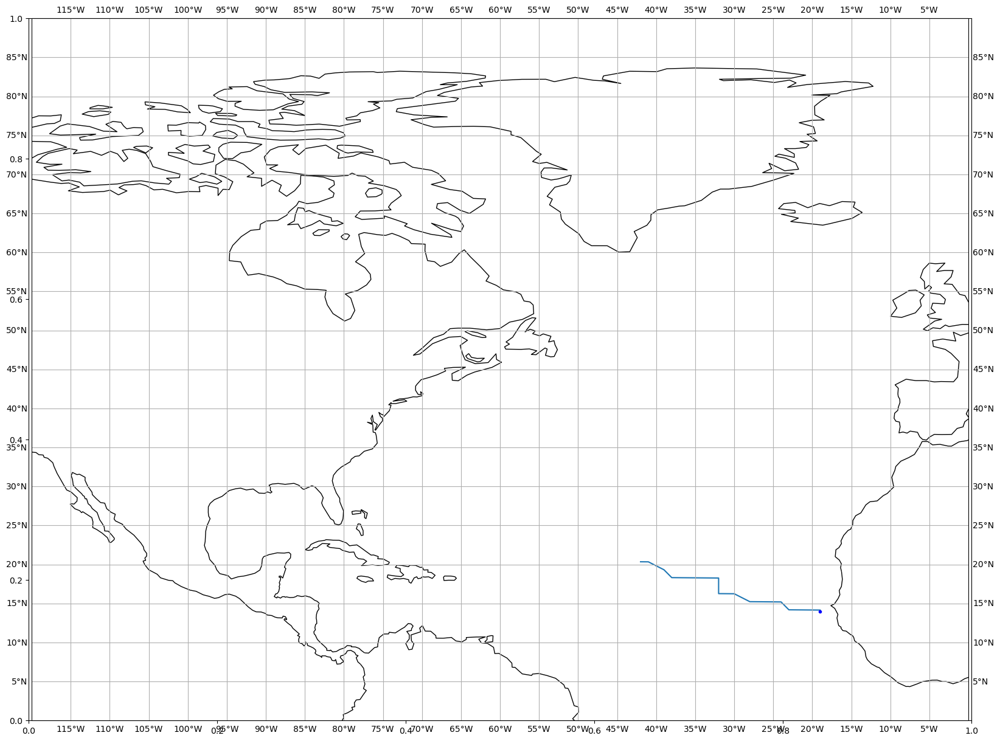

In [73]:
predict_path(([-19], [14]))